In [1]:
import pandas as pd
import numpy as np
import os
import random
from helpers.load_cfg import load_cfg

import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)

    except RuntimeError as e:
        print(e)

## Load Data

In [2]:
# files containing both train and val/test data

files = []

# files used for training set

train_files = [] 

# files used for val/test set

test_files = [] 

# list containing targets in dataframe (one or more)

targets = []

# list containing features to drop from data (empty if all features should be used)

features_to_drop = {'' : []}


In [3]:
def load_data(list_of_files, features_to_drop):
    """ Load data from 'data' directory.
    Args:
        list_of_files: list of file names to load
        features_to_drop: list of features to drop from dataframe
    Returns:
        data: dictionary containing dataframes of each file.
    """
    path = os.path.join(os.getcwd(),'data')
    data = {}
    for file in list_of_files:
        filepath = os.path.join(path, file)
        df = pd.read_csv(filepath).drop(features_to_drop, axis = 1)
        data[file] = df
        print(f"Loaded {file} with shape {data[file].shape}")
    return data

# read cfg 
cfg = load_cfg("cfg.txt")

# load data 
data = load_data(files, features_to_drop)

## Preprocessing

In [5]:
from scipy.stats import skew
from sklearn.preprocessing import QuantileTransformer, StandardScaler
import numpy.ma as ma

from scipy.stats import skew
from sklearn.preprocessing import QuantileTransformer, StandardScaler
import numpy.ma as ma

def fit_preprocessing(data, train_files, targets):
    """ Combine train files and fit standardizer.
    
    targets: list of targets in the dataframe
    """
    df_train = pd.concat([data[file] for file in train_files], ignore_index = True)
    scaler = StandardScaler()
    # drop time and targets as they are not transformed
    cols_to_drop = ["Time"] + targets
    df = df_train.drop(cols_to_drop, axis = 1)
    # fit standardizer
    scaler.fit(df.to_numpy())

    return df_train, scaler

def preprocess_train_data(scaler, data, train_files, targets, target_index = -1):
    """ 
    Transform combined training files and transform train files.
    
    Args:
        scaler: StandardScaler fit on combined train files
        data: dataframe with loaded dataframes names with filename as key
        train_files: list of train files to be combined
        targets: list of 1..n targets in dataframes
        target_index: index within targets list of model target
    
    Returns:
        df_train
    """
    # Combine trips
    df_train = pd.concat([data[file] for file in train_files], ignore_index = True)
    tgt = targets[target_index]
    # compute mean and std of target on combined files
    tgt_mean = float(df_train[tgt].mean())
    tgt_std = float(df_train[tgt].std())
    # transform features 
    target = df_train[tgt].to_numpy().reshape(-1,1) # target
    time = np.arange(len(df_train)).reshape(-1,1) # time
    df_train = df_train.drop(targets + ["Time"], axis = 1)
    np_norm = scaler.transform(df_train.to_numpy()) # transform features
    #compute z-score of target
    sample_weights = abs(((target - tgt_mean)/tgt_std))
    sample_weights = 1/(1 + np.exp(-sample_weights))
    # concatenate data and append to preprocessed data
    df_train = np.concatenate((time, np_norm, target, sample_weights), axis = 1)
         
    return df_train

from sklearn.model_selection import train_test_split
    
def preprocess_test_data(scaler, data, test_files, targets, target_index = -1, split = 0.5):
    """ 
    Concat all test files and split in validation and test set according to split.
    
    Args:
        scaler: StandardScaler fit on combined train trips
        data: dataframe with loaded dataframes names with filename as key
        test_files: list of train files to be combined
        targets: list of 1..n targets in dataframes
        target_index: index within targets list of model target
        split: val/test split
    
    Returns:
        df_val, df_test
    """
    tgt = targets[target_index]
    val_test_sets = [] 
    for index, file in enumerate(test_files):
        df = data[file]
        # transform features 
        target = df[tgt].to_numpy().reshape(-1,1) # target
        time = np.arange(len(df)).reshape(-1,1) # time
        df = df.drop(targets + ["Time"], axis = 1)
        np_norm = scaler.transform(df.to_numpy()) # transform features
        # dummy sample weights
        sample_weights = np.ones((len(df), 1))
        # concatenate data and append to preprocessed data
        df = np.concatenate((time, np_norm, target, sample_weights), axis = 1)
        val_test_sets.append(df)
    
    # combine sets and split
    df = np.concatenate((val_test_sets))    
    df_val, df_test = train_test_split(df, test_size = split, shuffle = False)
                                 
    return  df_val, df_test

def create_dataset(df, window_size, batch_size, buffer_size, sample_weighting = False, stride = 1,
                   shuffle = None):
    """ Create a tf.data.dataset from numpy array.
    """
    data = df.astype('float32')
    data = tf.data.Dataset.from_tensor_slices(data)
    data = data.window(window_size, shift = 1, stride = stride , drop_remainder = True)
    data = data.flat_map(lambda window: window.batch(window_size))
    if shuffle:
        data = data.shuffle(buffer_size)
    if sample_weighting:
        data = data.map(lambda k: ((k[:,:-2], tf.reshape(k[:,-2], [window_size, 1])), 
                                     tf.reshape(k[:,-2], [window_size, 1]), 
                                     k[-1,-1])) # tuple ([encoder input, decoder input] , target, sample weights)
    else:
        data = data.map(lambda k: ((k[:,:-2], tf.reshape(k[:,-2], [window_size, 1])), 
                                    tf.reshape(k[:,-2], [window_size, 1]))) # tuple ([encoder input, decoder input] , target)

    data = data.batch(batch_size, drop_remainder = True).prefetch(2)
    
    return data

In [6]:
# read cfg inputs

Tx = int(cfg["input_time_steps"])
batch_size = int(cfg["batch_size"])
val_batch_size = int(cfg["inference_batch_size"])
test_batch_size = val_batch_size
buffer_size = int(cfg["buffer_size"])

# fit preprocessing

train_trips, scaler = fit_preprocessing(data, train_files, targets)

# preprocess train and test trips

df_train = preprocess_train_data(scaler, data, train_files, targets, target_index = -1)
df_val, df_test = preprocess_test_data(scaler, data, test_files, targets, target_index = -1, split = 0.5)

# create tf.datasets

train_data = create_dataset(df_train, Tx, batch_size, buffer_size, stride = 2,
                            shuffle = True, sample_weighting = False)
val_data = create_dataset(df_val, Tx, val_batch_size, buffer_size, stride = 2,
                          shuffle = False, sample_weighting = False)
test_data = create_dataset(df_test, Tx, val_batch_size, buffer_size, stride = 2,
                          shuffle = False, sample_weighting = False)

## Build Model

### Custom Layers

In [18]:
from tensorflow.keras import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import GRU, RNN, Dense, Dropout, TimeDistributed, RepeatVector, Lambda

class Encoder(Layer):
    
    def __init__(self, enc_units, dropout):
        super(Encoder, self).__init__()
        self.enc_units = enc_units
        self.dropout = dropout
        self.gru = GRU(self.enc_units, return_sequences = True, return_state = True, 
                        recurrent_dropout = self.dropout)
        self.drop_time = Lambda(lambda k: k[:,:,1:]) # -> drop time feature
        
    def call(self, x):
        x = self.drop_time(x)
        hidden_states, final_state = self.gru(x)
        
        return hidden_states, final_state
    

class Attention(Layer):
    
    def __init__(self, Tx, units):
        """
        Tx: Encoder Input sequence length
        """
        super(Attention, self).__init__()
        self.dense_units = units
        self.repeat = RepeatVector(Tx)
        self.dense = TimeDistributed(Dense(self.dense_units))
        
    def call(self, decoder_state, hidden_states, alignment = 'dot'):
        """ Luong's Attention. 
        1) 'dot' : dot-product-attention
        2) 'general': lernable attention where keys are passed through a TimeDistributed Dense
        
        Args:
        alignment: alignment function used to compute scores ('dot' or 'general')
        query: decoder state at current time step: q == shape(batch, 1, units)
        keys and values: hidden encoder states: k, v == shape (batch, Tx, units)
        
        """
        q = tf.expand_dims(decoder_state, 1)
        k = hidden_states
        v = hidden_states
        # compute alignment scores between keys and queries: scores == shape (batch, 1, Tx)
        # with one score for every time step 
        # for alignment 'general': keys are passed through a TimeDistributed Dense with learnable parameters
        if alignment == 'general':
            k = self.dense(k)
        scores = tf.matmul(q, k, transpose_b = True)
        # compute distribution by applying softmax and reshape att_weights to
        #  att_weights == shape (batch, Tx, 1)
        att_weights = tf.nn.softmax(scores)
        att_weights = tf.transpose(att_weights, [0,2,1])
        # compute context vector by scaling every input encoder state by the corresponding attention weight
        # and consequently summing the weighted encoder states
        # with context == shape (batch, units)
        context = att_weights * v
        context = tf.math.reduce_sum(context, axis = 1)
        
        return context, att_weights
    
class DecoderLayer(Layer):
    
    def __init__(self, dec_units, Tx, dropout):
        """
        Args:
        dec_units: LSTM decoder cell units
        Tx: length of decoder input sequence
        """
        super(DecoderLayer, self).__init__()
        
        self.lstm = GRU(dec_units, return_state = True, return_sequences = False, 
                        recurrent_dropout = dropout)
        self.Wc = Dense(dec_units, activation = 'tanh') # used to compute attentional hidden states -> (batch_size, dec_units)
        self.Wo = Dense(1) # used to predict output -> (batch_size, 1)
        self.attention = Attention(Tx, dec_units)
        
    def call(self, dec_input, state, enc_output):
        # compute LSTM cell
        dec_out, h_state = self.lstm(dec_input, initial_state = state)
        # compute context vector and attention weights
        context, att_weights = self.attention(dec_out, enc_output, alignment = 'general')
        # concat decoder output and context vector and feed it into a Dense layer with tanh activation
        # att_hidden_state == shape (batch, dec_units)
        att_hidden_state = self.Wc(tf.concat([context, dec_out], 1)) # will be fed as dec_input at next timestep
        out = self.Wo(att_hidden_state)
        # expand att_hidden_state as it will be fed together with the final prediction into the following RNN cell
        # RNN input of one cell is of shape (batch, timesteps = 1, dec_units)
        att_hidden_state = tf.expand_dims(att_hidden_state, 1)
        
        return out, h_state, att_weights, att_hidden_state
    
class Decoder(Layer):
    
    def __init__(self, dec_units, Tx, dropout):
        """
        dense_units: units of dense layer computing the hidden alignment vectot h~.
        """
        super(Decoder, self).__init__()
        self.dec_units = dec_units
        self.decoder = DecoderLayer(dec_units, Tx, dropout)
        
    def call(self, y, enc_output, encoder_state, training):
        # initialise LSTM decoder states
        state = encoder_state
        # initialise LSTM input at first LSTM cell
        dec_input = tf.constant(0, shape = (y.shape[0], 1, 1 + self.dec_units), 
                                dtype = 'float32') # (batch, 1, 1 + h~ units)
        # predictions 
        preds = []
        # loop over Tx time steps -> decode -> output
        for t in range(y.shape[1]):
            # decode
            out, state, att_weights, att_hidden_state = self.decoder(dec_input, state, enc_output)
            if training:
                # update decoder input for next time step using teacher forcing with a certain probability p
                p = 1
                if random.random() <= p:
                    # teacher forcing
                    y_dec = tf.expand_dims(y[:, t], 1) # (batch_size, 1,1 )
                else:
                    # use decoder prediction as next input 
                    y_dec = tf.expand_dims(out, 1)
                    
            else:
                # use decoder prediction as next input in eval mode
                y_dec = tf.expand_dims(out, 1)
            dec_input = tf.concat([att_hidden_state, y_dec], axis = -1) # (batch, 1, dec_units + 1)
            # append predictions
            preds.append(out)
        # predictions of sequence ->(batch, t, 1)
        preds = tf.concat(preds, 1)
        
        return preds, att_weights

### ED with Attention

In [19]:
class EDA(Model):
    
    def __init__(self, enc_units, dropout, dec_units, Tx):
        super(EDA, self).__init__()
        self.encoder = Encoder(enc_units, dropout)
        self.decoder = Decoder(dec_units, Tx, dropout)
    
    def  call(self, X, training = None):
        enc_x, dec_x = X
        # encoder
        hidden_states, final_encoder_state = self.encoder(enc_x)
        # decoder with attention 
        out, att_weights = self.decoder(dec_x, hidden_states, final_encoder_state, training)
        
        return out, att_weights

In [20]:
# inputs
enc_units = int(cfg["encoder_units"])
dec_units = int(cfg["decoder_units"])
dropout = int(cfg["dropout"])
# call model
model = EDA(enc_units, dropout, dec_units, Tx)

## Compile Model

In [21]:
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.optimizers import schedules

from tensorflow_addons.optimizers import CyclicalLearningRate, ExponentialCyclicalLearningRate
# inputs
initial_learning_rate = 0.001
maximal_learning_rate = 0.01
epoch_iterations = int(len(train_trips)/batch_size)

# early stopping
checkpoint_filepath = os.path.join(os.getcwd(),'tmp', 'checkpoint')
callbacks = [tf.keras.callbacks.EarlyStopping(
                monitor="val_loss", min_delta=1000,
                patience=5, verbose=1 ),
            tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_filepath, save_weights_only = True,
                                               monitor = 'val_loss', mode = 'min', save_best_only = True, 
                                                verbose = 0)]
lr_schedule = ExponentialCyclicalLearningRate(
    initial_learning_rate = initial_learning_rate,
    maximal_learning_rate = maximal_learning_rate, gamma = 0.95,
    step_size = (epoch_iterations/4)) # step_size = 1/2 cycle

opt = tf.keras.optimizers.Adam(learning_rate = lr_schedule)
loss_fn = MeanSquaredError() 
# compile
model.compile(optimizer = opt, loss = loss_fn, loss_weights = (1,0)) 

## Train

In [22]:
# inputs
epochs = 50
print("Fit Encoder-Decoder with attention to training data...")
history = model.fit(train_data, validation_data = val_data, epochs = epochs, callbacks = callbacks) 
model.load_weights(checkpoint_filepath)

Fit Encoder-Decoder with attention to training data...
Epoch 1/50
27796/27796 [==============================] - 646s 23ms/step - loss: 1158987.5000 - output_1_loss: 1158987.5000 - output_2_loss: 1392334.5000 - val_loss: 968437.8125 - val_output_1_loss: 968437.8125 - val_output_2_loss: 1709496.1250
Epoch 2/50
27796/27796 [==============================] - 639s 23ms/step - loss: 918495.5625 - output_1_loss: 918495.5625 - output_2_loss: 1392187.6250 - val_loss: 694385.8125 - val_output_1_loss: 694385.8125 - val_output_2_loss: 1709496.5000
Epoch 3/50
27796/27796 [==============================] - 595s 21ms/step - loss: 795317.5000 - output_1_loss: 795317.5000 - output_2_loss: 1392214.0000 - val_loss: 523679.6875 - val_output_1_loss: 523679.6875 - val_output_2_loss: 1709496.3750
Epoch 4/50
27796/27796 [==============================] - 639s 23ms/step - loss: 711649.4375 - output_1_loss: 711649.4375 - output_2_loss: 1392275.8750 - val_loss: 430793.9062 - val_output_1_loss: 430793.9062 - val

### History

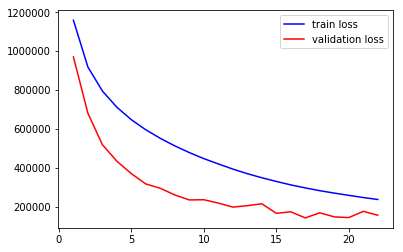

In [12]:
import matplotlib.pyplot as plt

train_loss = history.history['loss']
val_loss = history.history['val_loss']

epoch_stop = callbacks[0].stopped_epoch
if epoch_stop == 0:
    epoch_stop = epochs-1
    
x_epochs = np.arange(1, epoch_stop+2)
plt.plot(x_epochs, train_loss, 'b', label = "train loss")
plt.plot(x_epochs, val_loss, 'r', label = "validation loss")
plt.legend()


## Evaluation

### Create Dataframe for Evaluation

In [13]:
# inputs

test = True # True:test data, False: validation data

if test:
    iterator = iter(test_data)
else:
    iterator = iter(val_data)

# iterate and get model predictions

x, y = iterator.get_next()
# y_pred == shape(batch, Tx)
# att == shape(batch, Tx, 1)
y_pred, att = model.predict(x)
att = att[:,:,0]
y_pred = y_pred[:,-1].reshape(-1,1) # get prediction at t = Tx
y_true = y[:,-1,:].numpy() # get true value at t = Tx

# inverse transform features 

# x == shape(batch, Tx, features)
x, _ = x # x = (enc_x, dec_x)
x_time = x[:, -1, 0].numpy().reshape(-1,1) # time at t = Tx
x = x[:,-1, 1:].numpy() # features except time at prediction time step
x = scaler.inverse_transform(x)
x = np.concatenate((x_time, x), axis = 1)


# build dataframe with features and store it in "features" dictionary

cols = train_trips.columns[:-len(targets)]
features = pd.DataFrame(x, columns = cols)   

# build dataframe with labels and predictions and store it in "predictions" dictionary

cols = ["Time", "Prediction", "True"]
predictions =  pd.DataFrame(np.concatenate((x_time, y_pred, y_true ), axis = 1), columns = cols)

# build dataframe with attention weights and store it in "attention_weights"

cols = ["Time"]+["t({})".format(time_step) for time_step in range(-Tx+1,1)]
attention_weights = pd.DataFrame(np.concatenate((x_time,att), axis = 1), columns = cols)


### Evaluate accuracy

In [14]:
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(predictions["True"],predictions["Prediction"])
print(f"MSE: {mse}")

MSE on city trip: 180354.875
MSE on highway trip: 318808.59375


### Plot Predictions

In [15]:
import plotly.graph_objs as go
import plotly.offline as pyo
pyo.init_notebook_mode(connected = True)

# inputs 

start = 0
window = 130000

# select relevant window
df = predictions[start:start+window]

# True Target Values
trace1 = go.Scatter(
                    x = np.arange(len(df)),
                    y = df["True"],
                    mode = "lines",
                    name = "Target",
                    marker = dict(color = 'rgb(20, 112, 204)'))
# Predicted Values
trace2 = go.Scatter(
                    x = np.arange(len(df)),
                    y = df["Prediction"],
                    mode = "lines",
                    name = "Model Predictions",
                    marker = dict(color = 'rgb(255, 55, 55)'))
    
data = [trace1, trace2]
layout = dict(title = f"MLP Attention Predictions",
              yaxis= dict(title= target, ticklen= 5,zeroline= False),
              xaxis= dict(title= "Time", ticklen= 5,zeroline= False)
             )
fig = go.Figure(dict(data = data, layout = layout))
fig.show()

### Visualise attention weights

In [16]:
from plotly.subplots import make_subplots

# inputs
index = 500
time_stamp = predictions["Time"][index]

# data
df = predictions
att = attention_weights

# get index of datapoint
index = df.index[df[f"Time"] == time_stamp].to_list()[0]
# get data at index, previous Tx-1 values, and following Tx values
df = df[["Time", "Prediction"]].iloc[index - Tx + 1:index + 1 + Tx]
# get index of attention weights for given timestamp
att_index = att.index[att[f"Time"] == time_stamp].to_list()[0]

# Predicted Values up to time stamp
trace1 = go.Scatter(
                    x = np.array([index for index in range(Tx)]).reshape(-1),
                    y = df["Prediction"].iloc[0:Tx],
                    mode = "lines",
                    name = "Past Values",
                    marker = dict(color = 'rgb(20, 112, 204)'))

# Predicted values following time stamp
trace2 = go.Scatter(
                    x = np.array([index for index in range(Tx-1, 2*Tx)]).reshape(-1),
                    y = df["Prediction"].iloc[Tx-1:2*Tx],
                    line = dict(dash = 'dash'),
                    name = "Future",
                    marker = dict(color = 'rgb(20, 112, 204)'))
# attention weights
trace3 = go.Scatter(
                    x = np.array([index for index in range(Tx)]).reshape(-1),
                    y = att.iloc[att_index].drop('Time'),
                    mode = "lines",
                    name = "Attention Weights",
                    marker = dict(color = 'rgb(255, 55, 55)'))

att_fig = make_subplots(specs=[[{"secondary_y": True}]])
att_fig.add_trace(trace1,  secondary_y=False)
att_fig.add_trace(trace2,  secondary_y=False)
att_fig.add_trace(trace3,  secondary_y=True)

# Add figure title
att_fig.update_layout(
    title_text=f"Visualisation of attention weights at t = {time_stamp} - {trip}"
)

# Set x-axis title
att_fig.update_xaxes(title_text="Time")
# x-axis ticks
att_fig.update_layout(xaxis = dict(
        tickmode = 'linear',
        tick0 = 0 ,
        dtick = 1))


# Set y-axes titles
att_fig.update_yaxes(title_text=f"{target}", secondary_y=False)
att_fig.update_yaxes(title_text="Attention Weights", secondary_y=True)

# Vertical line at time stamp
att_fig.update_layout(shapes=[dict(
      type= 'line',
      yref= 'paper', y0= 0, y1= 1,
      xref= 'x', x0= Tx-1, x1= Tx-1)])

att_fig.show()

### How do attention weights behave?

In [17]:
# get attention weights 
att = attention_weights
# get mean of each time step
mean = att.mean(axis = 0)
quantiles = att.quantile([0.1,0.5,0.9])

# mean

trace1 = go.Scatter(
                    x = np.array([index for index in range(Tx)]).reshape(-1),
                    y = mean[1:],
                    mode = "lines",
                    name = "Mean",
                    marker = dict(color = 'darkmagenta'))

# 0.1 quantile
trace2 = go.Scatter(
                    x = np.array([index for index in range(Tx)]).reshape(-1),
                    y = quantiles.loc[0.1][1:],
                    mode = "lines",
                    name = "0.1 Quantile",
                    marker = dict(color = 'blue'))
# 0.5 quantile
trace3 = go.Scatter(
                    x = np.array([index for index in range(Tx)]).reshape(-1),
                    y = quantiles.loc[0.5][1:],
                    mode = "lines",
                    name = "0.5 Quantile",
                    marker = dict(color = 'green'))
# 0.9 quantile
trace4 = go.Scatter(
                    x = np.array([index for index in range(Tx)]).reshape(-1),
                    y = quantiles.loc[0.9][1:],
                    mode = "lines",
                    name = "0.9 Quantile",
    
    
    
                    marker = dict(color = 'red'))

data = [trace1, trace2, trace3, trace4]
layout = dict(title = f"Attention weights statistics - {trip}",
              yaxis= dict(title= "Attention Weights", ticklen= 5,zeroline= False),
              xaxis= dict(title= "Timesteps", ticklen= 5,zeroline= False, 
                          tickmode = 'array',
                          tickvals = [index for index, val in enumerate(range(Tx))],
                          ticktext = [f"t({timestep*2})" for timestep in range(-Tx+1,1)]))
att_stat = go.Figure(dict(data = data, layout = layout))
att_stat.show()